**Model 1**



In [1]:
#librosa 只有第一次需要裝

#!pip install librosa

In [1]:
#載入所有需要的套件

import librosa
from librosa import display
import time
import numpy as np
import os
import pandas as pd
import glob 
import matplotlib.pyplot as plt
import joblib
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.ensemble import RandomForestClassifier
import keras
import tensorflow as tf
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Embedding
from keras.utils import to_categorical
from keras.layers import Input, Flatten, Dropout, Activation
from keras.layers import Conv1D, MaxPooling1D
from keras.models import Model
from keras.callbacks import ModelCheckpoint
import joblib


%matplotlib inline

Using TensorFlow backend.


# 讀一個 wav 檔看結果

In [12]:
#data, sampling_rate = librosa.load('01-01-01-01-01-01-01.wav')
X, sample_rate = librosa.load('../Recording test data/congress_fight_1.wav', res_type='kaiser_fast')
mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=100).T,axis=0) 

In [13]:
mfccs.shape

(100,)

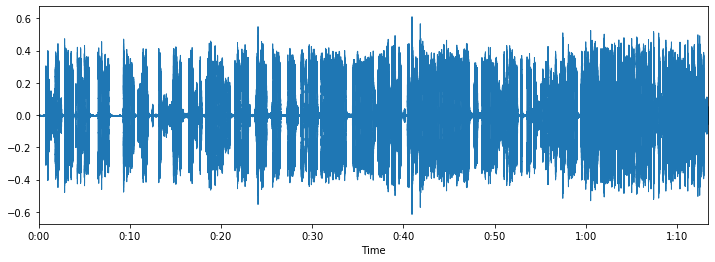

In [15]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X, sr=sample_rate)

In [ ]:
sound = AudioSegment.from_file(audio_path)

In [20]:
from IPython.display import Audio
Audio(np.sin(X), rate=20000)

In [48]:
Xt, index = librosa.effects.trim(X, top_db=30, ref=np.max, frame_length=1024, hop_length=512)

In [49]:
Audio(np.sin(Xt), rate=20000)

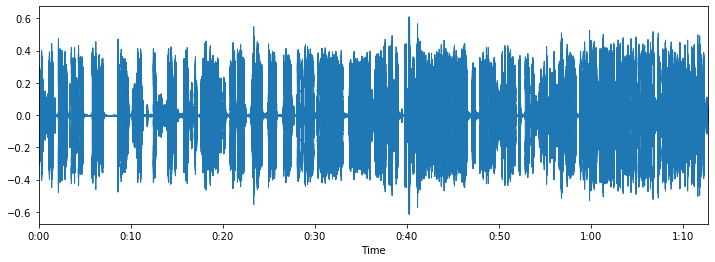

In [50]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(Xt, sr=sample_rate)

In [51]:
Xe = librosa.effects.preemphasis(X, coef=0.97, zi=None, return_zf=False)

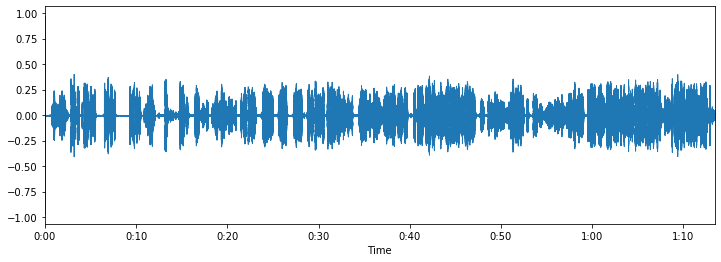

In [52]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(Xe, sr=sample_rate)

In [53]:
Audio(np.sin(Xe), rate=20000)

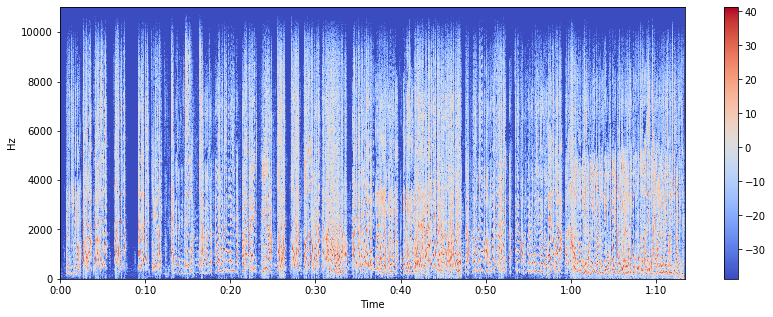

In [54]:
#display Spectrogram
A = librosa.stft(X)
Adb = librosa.amplitude_to_db(abs(A))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Adb, sr=sample_rate, x_axis='time', y_axis='hz') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

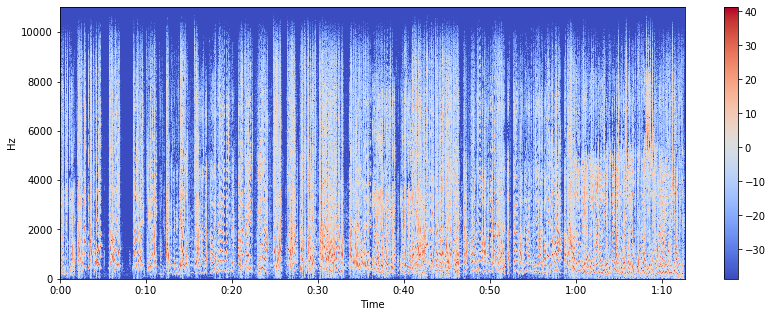

In [55]:
#display Spectrogram
A = librosa.stft(Xt)
Adb = librosa.amplitude_to_db(abs(A))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Adb, sr=sample_rate, x_axis='time', y_axis='hz') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

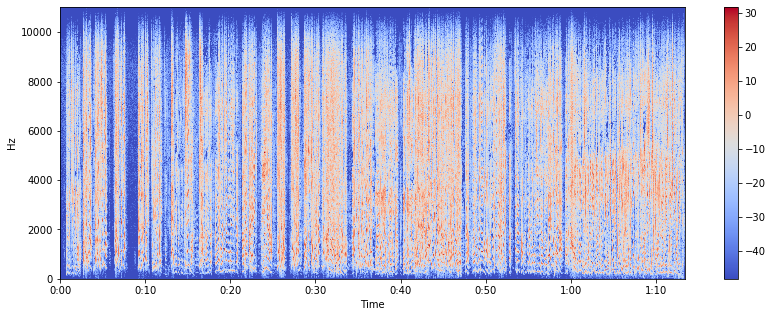

In [56]:
#display Spectrogram
A = librosa.stft(Xe)
Adb = librosa.amplitude_to_db(abs(A))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Adb, sr=sample_rate, x_axis='time', y_axis='hz') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

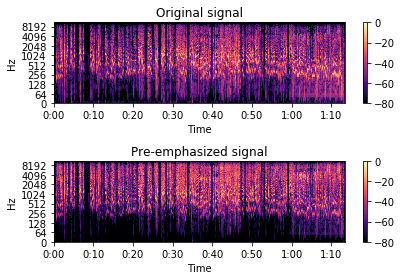

In [57]:
S_orig = librosa.amplitude_to_db(np.abs(librosa.stft(X)), ref=np.max)
S_preemph = librosa.amplitude_to_db(np.abs(librosa.stft(Xe)), ref=np.max)
plt.subplot(2,1,1)
librosa.display.specshow(S_orig, y_axis='log', x_axis='time')
plt.title('Original signal')
plt.colorbar()
plt.subplot(2,1,2)
librosa.display.specshow(S_preemph, y_axis='log', x_axis='time')
plt.title('Pre-emphasized signal')
plt.colorbar()
plt.tight_layout();

# 進行建模事前準備
## 設定檔

In [5]:
#path = '../../../dataset/ravdess_datasets/'
#path = '../../../dataset/ravdess_datasets/Audio_Song_Actors/'
path = '../../../dataset/ravdess_datasets/Audio_Song_Actors/Actor_01'
lst = []
save_dir = 'joblib'

In [6]:
# Dynamic Value Change
def dyn_change(data):
    """
    Random Value Change.
    """
    dyn_change = np.random.uniform(low=1.5,high=3)
    return (data * dyn_change)

In [7]:
# Pitch Tuning
def pitch(data, sample_rate):
    """
    Pitch Tuning.
    """
    bins_per_octave = 12 # default = 12
    pitch_pm = 2
    pitch_change =  pitch_pm * 2*(np.random.uniform())   
    data = librosa.effects.pitch_shift(data.astype('float64'), 
                                      sample_rate, 
                                      #n_steps=pitch_change, 
                                      n_steps=48, # how many (fractional) half-steps to shift
                                      bins_per_octave=bins_per_octave)
    return data

In [8]:
# Shifting
def shift(data):
    """
    Random Shifting.
    """
    s_range = int(np.random.uniform(low=-5, high = 5)*500)
    return np.roll(data, s_range)

In [9]:
# White Noise Adding
def noise(data):
    """
    Adding White Noise.
    """
    # you can take any distribution from https://docs.scipy.org/doc/numpy-1.13.0/reference/routines.random.html
    noise_amp = 0.005*np.random.uniform()*np.amax(data)
    data = data.astype('float64') + noise_amp * np.random.normal(size=data.shape[0])
    return data

# Testing

In [ ]:
melfb = librosa.filters.mel(22050, 2048)
melfb
# array([[ 0.   ,  0.016, ...,  0.   ,  0.   ],
# [ 0.   ,  0.   , ...,  0.   ,  0.   ],
# ...,
# [ 0.   ,  0.   , ...,  0.   ,  0.   ],
# [ 0.   ,  0.   , ...,  0.   ,  0.   ]])

# Clip the maximum frequency to 8KHz

librosa.filters.mel(22050, 2048, fmax=8000)
# array([[ 0.  ,  0.02, ...,  0.  ,  0.  ],
# [ 0.  ,  0.  , ...,  0.  ,  0.  ],
# ...,
# [ 0.  ,  0.  , ...,  0.  ,  0.  ],
# [ 0.  ,  0.  , ...,  0.  ,  0.  ]])

import matplotlib.pyplot as plt
plt.figure()
librosa.display.specshow(melfb, x_axis='linear')
plt.ylabel('Mel filter')
plt.title('Mel filter bank')
plt.colorbar()
plt.tight_layout()
plt.show()


In [95]:
data, sampling_rate = librosa.load('01-01-01-01-01-01-01.wav')
X, sample_rate = librosa.load('01-01-01-01-01-01-01.wav', res_type='kaiser_fast')
noise_X = noise(X)
shift_X = shift(X)
mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=40).T,axis=0) 

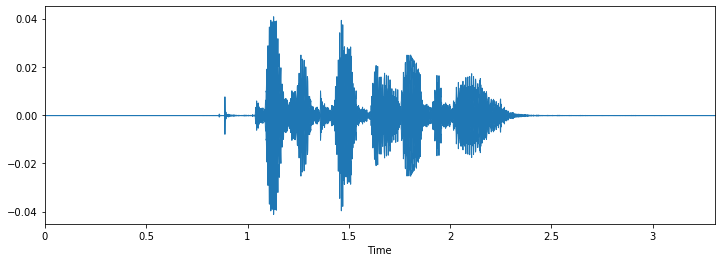

In [91]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(X, sr=sampling_rate)

In [72]:
t = X.size/sample_rate
print(t)

3.3066666666666666


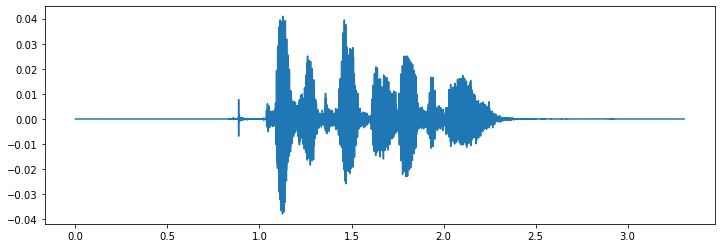

In [89]:
t = np.arange(X.size)/sample_rate
plt.figure(figsize=(12, 4))
plt.plot(t, X)
plt.show()

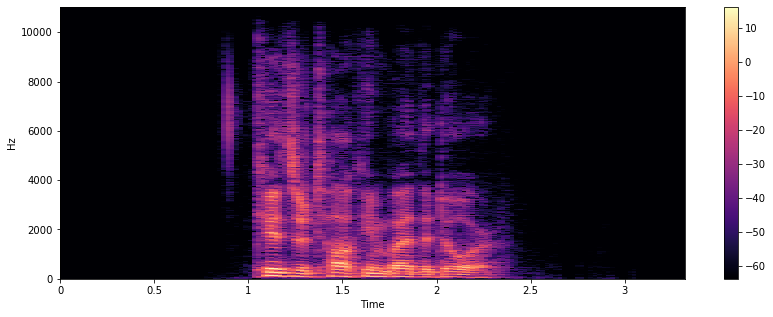

In [97]:
#display Spectrogram
A = librosa.stft(X)
Adb = librosa.amplitude_to_db(abs(A))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Adb, sr=sample_rate, x_axis='time', y_axis='hz') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

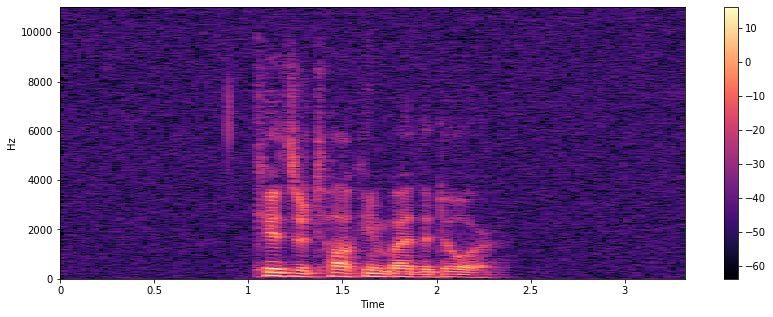

In [96]:
#display Spectrogram
A = librosa.stft(noise_X)
Adb = librosa.amplitude_to_db(abs(A))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Adb, sr=sample_rate, x_axis='time', y_axis='hz') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

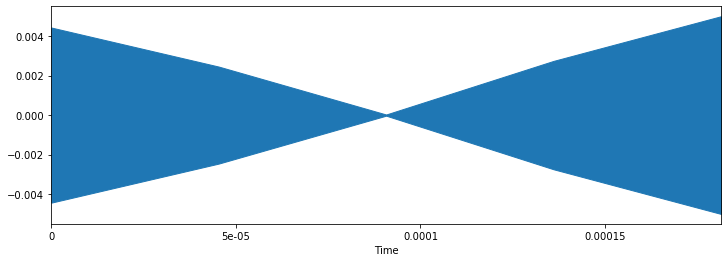

In [88]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(data[33000:33005], sr=sampling_rate)

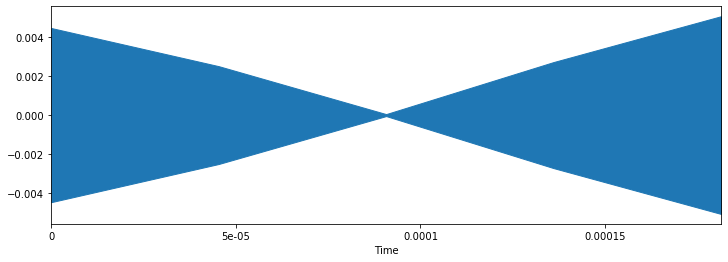

In [78]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(noise_X[33000:33005], sr=sampling_rate)

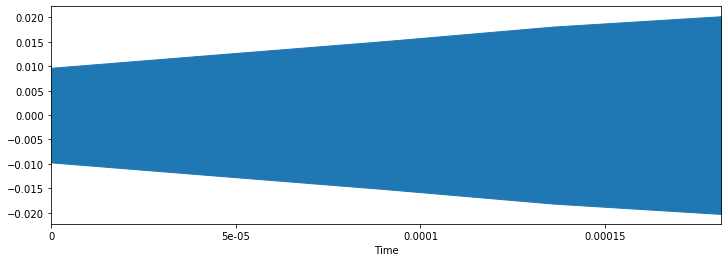

In [79]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(shift_X[33000:33005], sr=sampling_rate)

##  讀資料

In [10]:
start_time = time.time()
print("--- Start load Data. Start time: %s ---" % (start_time))
for subdir, dirs, files in os.walk(path):

    for file in files:
        try:
            #Load librosa array, obtain mfcss, store the file and the mcss information in a new array
            X, sample_rate = librosa.load(os.path.join(subdir,file), res_type='kaiser_fast')
            mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=100).T,axis=0) 
            # The instruction below converts the labels (from 1 to 8) to a series from 0 to 7
            # This is because our predictor needs to start from 0 otherwise it will try to predict also 0.
            file = int(file[7:8]) - 1 
            arr = mfccs, file
            lst.append(arr)
          # If the file is not valid, skip it
        except ValueError:
            continue

print("--- Data loaded. Loading time: %s seconds ---" % (time.time() - start_time))

--- Start load Data. Start time: 1585232462.4007895 ---
--- Data loaded. Loading time: 3.057210922241211 seconds ---


In [8]:
# Creating X and y: zip makes a list of all the first elements, and a list of all the second elements.
X, y = zip(*lst)

In [9]:
X = np.asarray(X)
y = np.asarray(y)
X.shape, y.shape

((44, 40), (44,))

In [10]:
# Saving joblib files to not load them again with the loop above
X_name = 'X.joblib'
y_name = 'y.joblib'
savedX = joblib.dump(X, os.path.join(save_dir, X_name))
savedy = joblib.dump(y, os.path.join(save_dir, y_name))

In [11]:
# Loading saved models
X = joblib.load(f'{save_dir}/X.joblib')
y = joblib.load(f'{save_dir}/y.joblib')

### Data Features

In [12]:
print(X)

[[-4.6141211e+02  4.7708580e+01 -2.7180742e+01 ...  9.3963261e+00
   1.2418282e+01  1.2511140e+01]
 [-5.9823950e+02  6.7875511e+01 -1.3587813e+01 ...  9.9695730e+00
   1.3733411e+01  1.4482876e+01]
 [-5.6877081e+02  5.7264446e+01 -1.4681897e+01 ...  4.6484771e+00
   9.4876947e+00  1.1641080e+01]
 ...
 [-4.7724655e+02  5.4185680e+01 -2.7591244e+01 ...  1.3103597e+01
   1.1478288e+01  9.3141289e+00]
 [-5.7997791e+02  5.8257195e+01 -2.3600700e+01 ...  3.1075332e+00
   7.2276616e+00  1.0903192e+01]
 [-5.5525977e+02  5.9461964e+01 -2.3049591e+01 ...  5.2968049e-01
   7.5189586e+00  1.0478172e+01]]


In [24]:
audio_path = '01-01-01-01-01-01-01.wav'
a, sr = librosa.load(os.path.join(audio_path))
print(type(a), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [25]:
librosa.load(audio_path, sr=44100)

(array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 44100)

In [29]:
import IPython.display as ipd
ipd.Audio(audio_path)

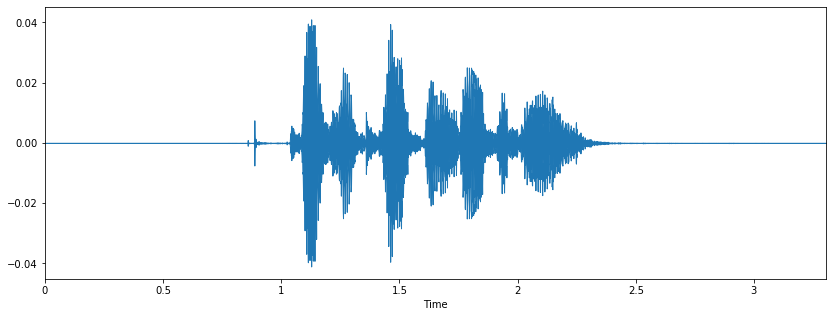

In [30]:
#display waveform
%matplotlib inline
import matplotlib.pyplot as plt
import librosa.display
plt.figure(figsize=(14, 5))
librosa.display.waveplot(a, sr=sr)

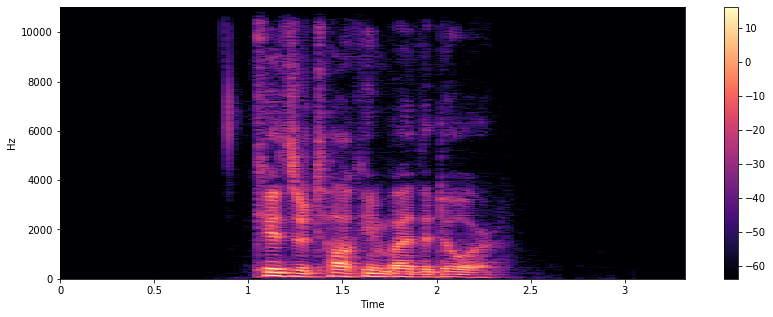

In [31]:
#display Spectrogram
A = librosa.stft(a)
Adb = librosa.amplitude_to_db(abs(A))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Adb, sr=sr, x_axis='time', y_axis='hz') 
#If to pring log of frequencies  
#librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

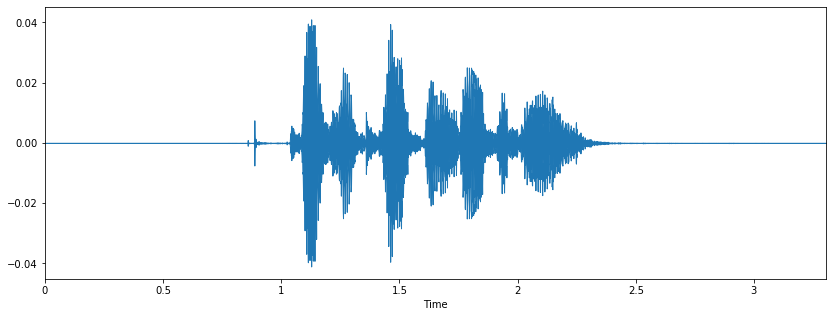

In [59]:
a, sr = librosa.load(audio_path)
#Plot the signal:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(a, sr=sr)

In [43]:
print(len(a))

72912


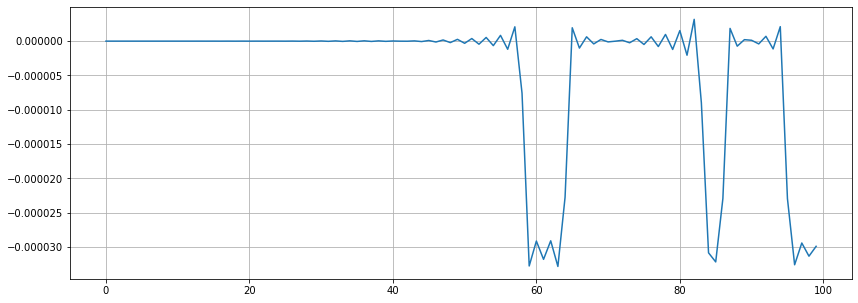

In [49]:
# Zooming in
n0 = 62000
n1 = 62100
plt.figure(figsize=(14, 5))
plt.plot(a[n0:n1])
plt.grid()

In [50]:
zero_crossings = librosa.zero_crossings(a[n0:n1], pad=False)
print(sum(zero_crossings))

81


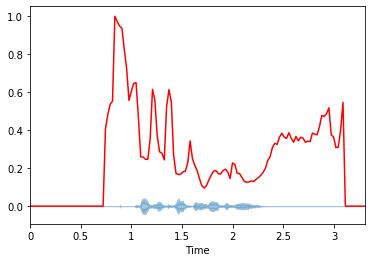

In [54]:
#spectral centroid -- centre of mass -- weighted mean of the frequencies present in the sound
import sklearn
spectral_centroids = librosa.feature.spectral_centroid(a, sr=sr)[0]
spectral_centroids.shape
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
# Normalising the spectral centroid for visualisation
def normalize(a, axis=0):
    return sklearn.preprocessing.minmax_scale(a, axis=axis)
#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(a, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

(20, 143)


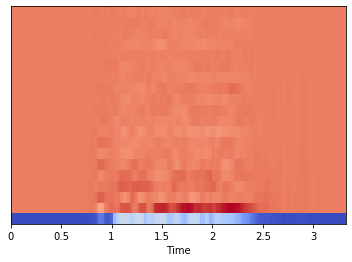

In [65]:
mfccs = librosa.feature.mfcc(a, sr=sr)
#mfccs = librosa.feature.mfcc(a, sr=sr, hop_length=1024, htk=True)
print(mfccs.shape)
#Displaying  the MFCCs:
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

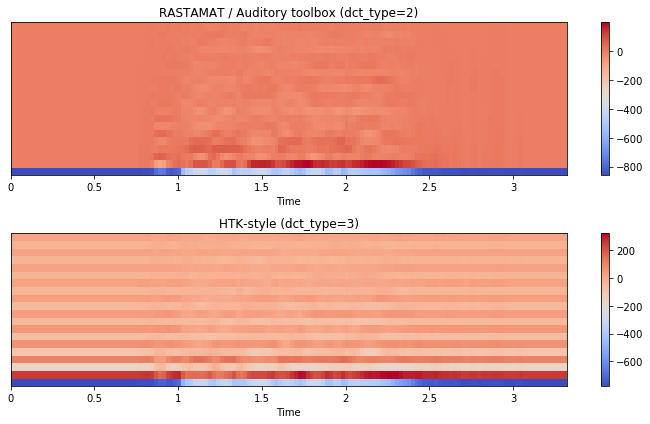

In [66]:
m_slaney = librosa.feature.mfcc(a, sr=sr, dct_type=2)
m_htk = librosa.feature.mfcc(a, sr=sr, dct_type=3)
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
librosa.display.specshow(m_slaney, x_axis='time')
plt.title('RASTAMAT / Auditory toolbox (dct_type=2)')
plt.colorbar()
plt.subplot(2, 1, 2)
librosa.display.specshow(m_htk, x_axis='time')
plt.title('HTK-style (dct_type=3)')
plt.colorbar()
plt.tight_layout()
plt.show()

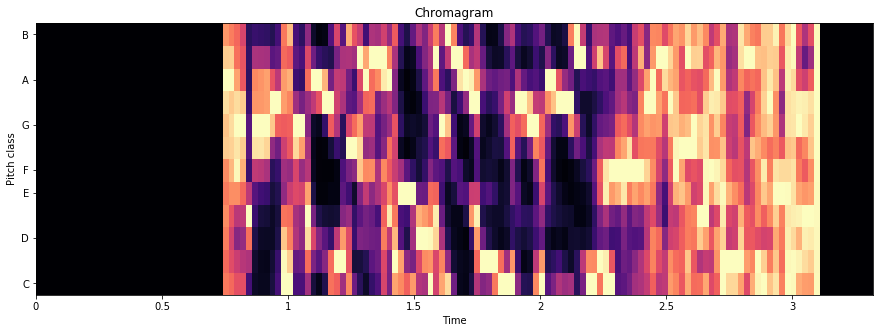

In [86]:
chromagram = librosa.feature.chroma_stft(a, sr=sr)
plt.figure(figsize=(15, 5))
plt.title('Chromagram')
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma')

In [67]:
spec_cent = librosa.feature.spectral_centroid(a, sr=sr)
print(spec_cent)

[[   0.            0.            0.            0.            0.
     0.            0.            0.            0.            0.
     0.            0.            0.            0.            0.
     0.            0.            0.            0.            0.
     0.            0.            0.            0.            0.
     0.            0.            0.            0.            0.
     0.            0.         2841.2984431  3367.72664251 3747.38209226
  3862.9150471  6987.34054643 6793.83262545 6627.52339629 6546.9358608
  5765.30757968 5070.89081053 3888.48886807 4226.03280267 4514.61849865
  4544.33251695 3265.92558541 1816.03448508 1804.08429129 1724.88341934
  1721.97064704 2459.27703374 4296.76139048 3899.26815888 2597.68022554
  1999.68790595 1947.12130266 1701.54394269 3663.80689907 4286.84157843
  3835.96764685 1868.6579282  1202.32977619 1161.1806272  1178.72750695
  1258.15889564 1291.92311923 1605.39323842 2397.40443442 1739.24243271
  1496.18793954 1294.45084913 1006.719282

In [69]:
zcr = librosa.feature.zero_crossing_rate(a)
print(zcr)

[[0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.         0.         0.         0.
  0.         0.         0.12988281 0.29980469 0.36425781 0.47509766
  0.50390625 0.48486328 0.55664062 0.56640625 0.54492188 0.47119141
  0.43408203 0.40234375 0.34228516 0.32470703 0.23779297 0.16259766
  0.09716797 0.04980469 0.07128906 0.13867188 0.16601562 0.17724609
  0.16699219 0.1015625  0.08007812 0.1171875  0.18212891 0.22167969
  0.22119141 0.17236328 0.09667969 0.06054688 0.06103516 0.06640625
  0.07177734 0.09570312 0.09228516 0.0859375  0.07470703 0.03662109
  0.02880859 0.02392578 0.02539062 0.02978516 0.0390625  0.04394531
  0.046875   0.05175781 0.04638672 0.04345703 0.04296875 0.03417969
  0.03125    0.03369141 0.02880859 0.03271484 0.03710938 0.03710938
  0.03955078 0.04199

##  切分訓練與測試資料

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

### 模型1: Decision Tree Classifier

In [17]:
dtree = DecisionTreeClassifier()

In [18]:
dtree.fit(X_train, y_train)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [19]:
predictions = dtree.predict(X_test)

In [20]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.50      1.00      0.67         1
           1       0.60      0.75      0.67         4
           2       1.00      0.60      0.75         5
           3       0.67      1.00      0.80         2
           4       1.00      1.00      1.00         2
           5       0.00      0.00      0.00         1

    accuracy                           0.73        15
   macro avg       0.63      0.72      0.65        15
weighted avg       0.75      0.73      0.71        15



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### 模型2: Random Forest

In [21]:
rforest = RandomForestClassifier(criterion="gini", max_depth=10, max_features="log2", 
                                 max_leaf_nodes = 100, min_samples_leaf = 3, min_samples_split = 20, 
                                 n_estimators= 22000, random_state= 5)

In [22]:
rforest.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='log2', max_leaf_nodes=100,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=20,
                       min_weight_fraction_leaf=0.0, n_estimators=22000,
                       n_jobs=None, oob_score=False, random_state=5, verbose=0,
                       warm_start=False)

In [24]:
predictions = rforest.predict(X_test)

In [25]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         5
           3       0.00      0.00      0.00         2
           4       1.00      1.00      1.00         2
           5       0.08      1.00      0.14         1

    accuracy                           0.20        15
   macro avg       0.18      0.33      0.19        15
weighted avg       0.14      0.20      0.14        15



/opt/conda/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


### 模型3: Neural network

In [26]:
x_traincnn = np.expand_dims(X_train, axis=2)
x_testcnn = np.expand_dims(X_test, axis=2)

In [27]:
x_traincnn.shape, x_testcnn.shape

((29, 40, 1), (15, 40, 1))

In [28]:
model = Sequential()

model.add(Conv1D(128, 5,padding='same',input_shape=(40,1)))
model.add(Activation('relu'))
model.add(Dropout(0.1))
model.add(MaxPooling1D(pool_size=(8)))
model.add(Conv1D(128, 5,padding='same',))
model.add(Activation('relu'))
model.add(Dropout(0.1))
model.add(Flatten())
model.add(Dense(8))
model.add(Activation('softmax'))
opt = keras.optimizers.Adam(lr=0.001)

In [29]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 40, 128)           768       
_________________________________________________________________
activation_1 (Activation)    (None, 40, 128)           0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 40, 128)           0         
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 5, 128)            0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 5, 128)            82048     
_________________________________________________________________
activation_2 (Activation)    (None, 5, 128)            0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 5, 128)           

In [30]:
model.compile(loss='sparse_categorical_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

In [31]:
cnnhistory=model.fit(x_traincnn, y_train, batch_size=32, epochs=1000, validation_data=(x_testcnn, y_test))

Train on 29 samples, validate on 15 samples
Epoch 1/1000
29/29 [==============================] - 2s 56ms/step - loss: 12.5262 - accuracy: 0.2414 - val_loss: 9.9155 - val_accuracy: 0.0667
Epoch 2/1000
29/29 [==============================] - 0s 211us/step - loss: 10.1994 - accuracy: 0.3103 - val_loss: 12.1706 - val_accuracy: 0.1333
Epoch 3/1000
29/29 [==============================] - 0s 190us/step - loss: 19.4666 - accuracy: 0.0690 - val_loss: 10.6420 - val_accuracy: 0.2667
Epoch 4/1000
29/29 [==============================] - 0s 189us/step - loss: 17.0033 - accuracy: 0.1379 - val_loss: 10.4647 - val_accuracy: 0.0667
Epoch 5/1000
29/29 [==============================] - 0s 186us/step - loss: 15.2152 - accuracy: 0.1724 - val_loss: 14.3554 - val_accuracy: 0.0667
Epoch 6/1000
29/29 [==============================] - 0s 180us/step - loss: 16.3478 - accuracy: 0.2069 - val_loss: 10.6813 - val_accuracy: 0.1333
Epoch 7/1000
29/29 [==============================] - 0s 194us/step - loss: 11.984

### Model Trained History

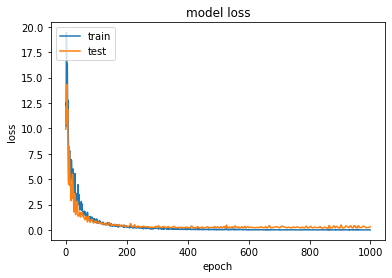

In [35]:
plt.plot(cnnhistory.history['loss'])
plt.plot(cnnhistory.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

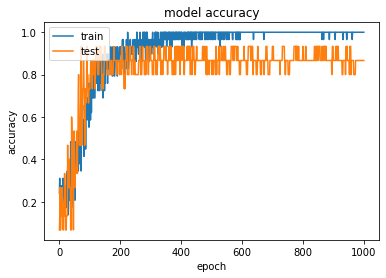

In [34]:
plt.plot(cnnhistory.history['accuracy'])
plt.plot(cnnhistory.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [36]:
predictions = model.predict_classes(x_testcnn)

In [37]:
predictions

array([2, 4, 1, 0, 1, 1, 4, 2, 2, 2, 1, 3, 1, 3, 3])

In [38]:
y_test

array([2, 4, 1, 0, 2, 1, 4, 2, 2, 2, 1, 3, 1, 3, 5])

In [39]:
new_Ytest = y_test.astype(int)

In [40]:
new_Ytest

array([2, 4, 1, 0, 2, 1, 4, 2, 2, 2, 1, 3, 1, 3, 5])

In [41]:
report = classification_report(new_Ytest, predictions)

/opt/conda/lib/python3.7/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [42]:
print(report)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         1
           1       0.80      1.00      0.89         4
           2       1.00      0.80      0.89         5
           3       0.67      1.00      0.80         2
           4       1.00      1.00      1.00         2
           5       0.00      0.00      0.00         1

    accuracy                           0.87        15
   macro avg       0.74      0.80      0.76        15
weighted avg       0.84      0.87      0.84        15



In [43]:
matrix = confusion_matrix(new_Ytest, predictions)
print (matrix)

[[1 0 0 0 0 0]
 [0 4 0 0 0 0]
 [0 1 4 0 0 0]
 [0 0 0 2 0 0]
 [0 0 0 0 2 0]
 [0 0 0 1 0 0]]


In [44]:
model_name = 'Emotion_Voice_Detection_Model.h5'
save_dir = 'Ravdess_model'
# Save model and weights
if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
model_path = os.path.join(save_dir, model_name)
model.save(model_path)
print('Saved trained model at %s ' % model_path)

Saved trained model at Ravdess_model/Emotion_Voice_Detection_Model.h5 


In [46]:
loaded_model = keras.models.load_model(f'{save_dir}/Emotion_Voice_Detection_Model.h5')
loaded_model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 40, 128)           768       
_________________________________________________________________
activation_1 (Activation)    (None, 40, 128)           0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 40, 128)           0         
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 5, 128)            0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 5, 128)            82048     
_________________________________________________________________
activation_2 (Activation)    (None, 5, 128)            0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 5, 128)           

In [47]:
loss, acc = loaded_model.evaluate(x_testcnn, y_test)
print("Restored model, accuracy: {:5.2f}%".format(100*acc))

15/15 [==============================] - 0s 4ms/step
Restored model, accuracy: 86.67%
